# Geospatial Analysis

# Load the Data

In [18]:
import pandas as pd

# Load the dataset
file_path = 'data/Dataset .csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset
print(data.head())


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

# Data Preprocessing

In [19]:
# Check for missing values in key columns
print(data[['Restaurant Name', 'City', 'Country Code', 'Longitude', 'Latitude', 'Aggregate rating']].isnull().sum())


Restaurant Name     0
City                0
Country Code        0
Longitude           0
Latitude            0
Aggregate rating    0
dtype: int64


#  Visualization

In [20]:
import pandas as pd
import folium

# Load your dataset
data = pd.read_csv('data/Dataset .csv')  

# Create a map centered around the average latitude and longitude
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=12)

# Add restaurant locations to the map
for idx, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(map)

# Display the map
map



C:\Users\kavidha\AppData\Local\Temp\ipykernel_18756\2273176166.py:11: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


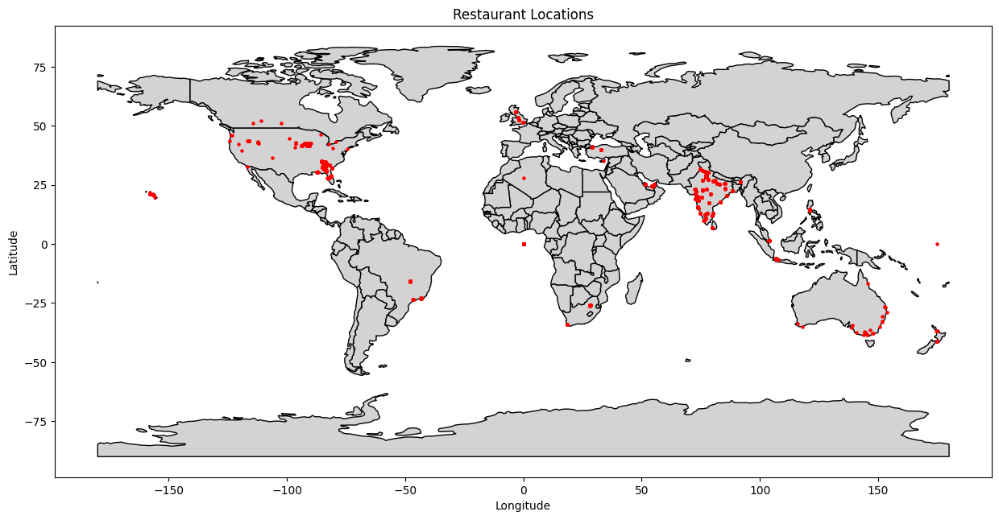

In [7]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

# Assuming 'data' is your DataFrame loaded from the CSV file
# Convert DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(
    data, geometry=gpd.points_from_xy(data.Longitude, data.Latitude))

# Load a world basemap
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Plotting
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgrey', edgecolor='black')  # Plot the base world map
gdf.plot(ax=ax, marker='o', color='red', markersize=5)   # Plot the restaurant locations

# Setting labels and title
ax.set_title('Restaurant Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()


# Distribution Analysis

In [21]:
# Frequency distribution of restaurants by city or country
city_distribution = data['City'].value_counts()
print(city_distribution.head(10))  # Display the top 10 cities with the most restaurants


City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


# Identifying Common Cities and Countries

In [22]:
# Identifying the most common cities and countries
top_cities = data['City'].value_counts().head(5)
top_countries = data['Country Code'].value_counts().head(5)

print("Top Cities:\n", top_cities)
print("\nTop Countries:\n", top_countries)


Top Cities:
 City
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
Name: count, dtype: int64

Top Countries:
 Country Code
1      8652
216     434
215      80
30       60
214      60
Name: count, dtype: int64


# Distribution Analysis for Selected Cities and Countries

In [23]:
# Analyzing selected cities
selected_cities = ['New Delhi', 'Gurgaon', 'Noida']
city_distribution = data[data['City'].isin(selected_cities)]['City'].value_counts()

# Analyzing selected countries
selected_countries = [1, 216]
country_distribution = data[data['Country Code'].isin(selected_countries)]['Country Code'].value_counts()

print("Restaurant Distribution in Selected Cities:\n", city_distribution)
print("\nRestaurant Distribution in Selected Countries:\n", country_distribution)


Restaurant Distribution in Selected Cities:
 City
New Delhi    5473
Gurgaon      1118
Noida        1080
Name: count, dtype: int64

Restaurant Distribution in Selected Countries:
 Country Code
1      8652
216     434
Name: count, dtype: int64


# Cuisine Analysis

In [24]:
# Extracting cuisine data for selected cities
selected_cities_data = data[data['City'].isin(['New Delhi', 'Gurgaon', 'Noida'])]

# Splitting the cuisines and counting their frequencies
cuisine_counts = selected_cities_data['Cuisines'].str.split(', ').explode().value_counts()

print("Most Popular Cuisines in New Delhi, Gurgaon, and Noida:\n", cuisine_counts.head(10))


Most Popular Cuisines in New Delhi, Gurgaon, and Noida:
 Cuisines
North Indian    3465
Chinese         2346
Fast Food       1789
Mughlai          901
Bakery           668
South Indian     549
Continental      538
Italian          524
Desserts         524
Street Food      522
Name: count, dtype: int64


# Segmentation by cuisine : 

In [25]:
# Extracting the primary cuisine
selected_cities_data['Primary Cuisine'] = selected_cities_data['Cuisines'].apply(lambda x: x.split(', ')[0])

# Grouping by primary cuisine
cuisine_analysis = selected_cities_data.groupby('Primary Cuisine').agg(
    Average_Rating=('Aggregate rating', 'mean'),
    Average_Price_Range=('Price range', 'mean'),
    Restaurant_Count=('Restaurant Name', 'count')
).sort_values(by='Restaurant_Count', ascending=False)

print("Cuisine Analysis:\n", cuisine_analysis.head(10))



Cuisine Analysis:
                  Average_Rating  Average_Price_Range  Restaurant_Count
Primary Cuisine                                                       
North Indian           2.294033             1.744335              2648
Chinese                2.187368             1.584211               760
Fast Food              2.269868             1.220199               604
Bakery                 2.271330             1.259067               579
Cafe                   2.975688             1.800459               436
South Indian           2.391342             1.294372               231
Mithai                 1.862882             1.048035               229
Street Food            2.233333             1.044444               225
Mughlai                1.869697             1.606061               198
Pizza                  2.426374             1.851648               182


C:\Users\kavidha\AppData\Local\Temp\ipykernel_18756\1388727550.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_cities_data['Primary Cuisine'] = selected_cities_data['Cuisines'].apply(lambda x: x.split(', ')[0])


# Location-Based Analysis:

In [26]:
# Identifying key localities in each city
key_localities = selected_cities_data['Locality'].value_counts().head(10)
print("Key Localities:\n", key_localities)

# Analyzing restaurant characteristics by locality
locality_analysis = selected_cities_data.groupby('Locality').agg(
    Average_Rating=('Aggregate rating', 'mean'),
    Average_Price_Range=('Price range', 'mean'),
    Restaurant_Count=('Restaurant Name', 'count')
).loc[key_localities.index]

print("\nRestaurant Characteristics by Locality:\n", locality_analysis)


Key Localities:
 Locality
Connaught Place        122
Rajouri Garden          99
Shahdara                87
Defence Colony          86
Pitampura               85
Mayur Vihar Phase 1     84
Malviya Nagar           84
Rajinder Nagar          81
Safdarjung              80
Satyaniketan            79
Name: count, dtype: int64

Restaurant Characteristics by Locality:
                      Average_Rating  Average_Price_Range  Restaurant_Count
Locality                                                                  
Connaught Place            3.686885             2.598361               122
Rajouri Garden             3.591919             2.202020                99
Shahdara                   1.413793             1.137931                87
Defence Colony             3.210465             1.930233                86
Pitampura                  2.870588             1.470588                85
Mayur Vihar Phase 1        2.026190             1.297619                84
Malviya Nagar              3.417857 

# Correlation Analysis

In [27]:
# Selecting relevant numerical variables
numerical_data = selected_cities_data[['Aggregate rating', 'Price range', 'Votes']]

# Calculating the correlation matrix
correlation_matrix = numerical_data.corr()

print("Correlation Matrix:\n", correlation_matrix)


Correlation Matrix:
                   Aggregate rating  Price range     Votes
Aggregate rating          1.000000     0.372624  0.291500
Price range               0.372624     1.000000  0.325489
Votes                     0.291500     0.325489  1.000000


# Average Rating Analysis


# Rating Distribution Analysis

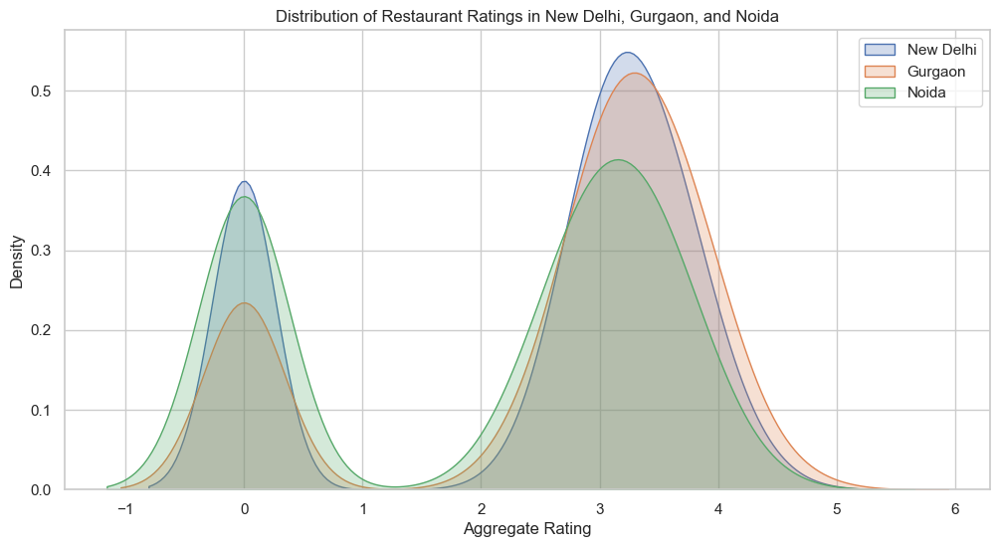

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Plotting the distribution of ratings for each city
plt.figure(figsize=(12, 6))
for city in ['New Delhi', 'Gurgaon', 'Noida']:
    subset = selected_cities_data[selected_cities_data['City'] == city]
    sns.kdeplot(subset['Aggregate rating'], label=city, fill=True)  # Updated here

plt.title('Distribution of Restaurant Ratings in New Delhi, Gurgaon, and Noida')
plt.xlabel('Aggregate Rating')
plt.ylabel('Density')
plt.legend()
plt.show()


# Comparison with Other Factors

# Average Rating by Cuisine Type

In [30]:
# Grouping by primary cuisine and city, then calculating average rating
cuisine_rating_comparison = selected_cities_data.groupby(['City', 'Primary Cuisine'])['Aggregate rating'].mean().unstack()

print("Average Rating by Cuisine Type in Each City:\n", cuisine_rating_comparison)


Average Rating by Cuisine Type in Each City:
 Primary Cuisine  Afghani  American  Arabian     Asian  Assamese  Awadhi  \
City                                                                      
Gurgaon            0.000  3.220833      3.1  3.966667       NaN     3.8   
New Delhi          0.725  3.229730      3.2  3.126923       2.1     0.0   
Noida                NaN  2.227273      NaN  3.833333       NaN     0.0   

Primary Cuisine    Bakery   Bengali  Beverages    Bihari  ...  South Indian  \
City                                                      ...                 
Gurgaon          2.620000  2.820000   2.722222  4.000000  ...      2.684000   
New Delhi        2.300756  2.981818   2.662745  3.433333  ...      2.361413   
Noida            1.756322  2.700000   1.435714       NaN  ...      2.309091   

Primary Cuisine  Spanish  Steak  Street Food  Sushi       Tea   Thai  \
City                                                                   
Gurgaon              NaN    3.6     2.

# Average Rating by Price Range

In [31]:
# Grouping by price range and city, then calculating average rating
price_rating_comparison = selected_cities_data.groupby(['City', 'Price range'])['Aggregate rating'].mean().unstack()

print("Average Rating by Price Range in Each City:\n", price_rating_comparison)


Average Rating by Price Range in Each City:
 Price range         1         2         3         4
City                                               
Gurgaon      2.012804  2.841818  3.570253  3.552239
New Delhi    1.959666  2.837198  3.449909  3.585648
Noida        1.581593  2.377057  3.175269  2.714286


# Rating and Votes Analysis

# Correlation Between Ratings and Votes

In [32]:
# Calculating the correlation between ratings and votes
rating_votes_correlation = selected_cities_data[['Aggregate rating', 'Votes']].corr()
print("Correlation between Ratings and Votes:\n", rating_votes_correlation)


Correlation between Ratings and Votes:
                   Aggregate rating   Votes
Aggregate rating            1.0000  0.2915
Votes                       0.2915  1.0000


# Scatter Plot for Visual Analysis

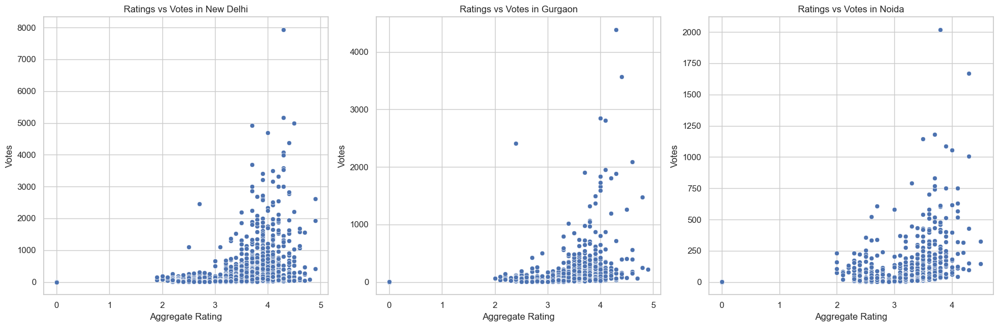

In [33]:
# Creating scatter plots for each city
plt.figure(figsize=(18, 6))

for i, city in enumerate(['New Delhi', 'Gurgaon', 'Noida'], 1):
    plt.subplot(1, 3, i)
    city_data = selected_cities_data[selected_cities_data['City'] == city]
    sns.scatterplot(x='Aggregate rating', y='Votes', data=city_data)
    plt.title(f'Ratings vs Votes in {city}')
    plt.xlabel('Aggregate Rating')
    plt.ylabel('Votes')

plt.tight_layout()
plt.show()


# Segmented Analysis by Locality

# Average Ratings by Locality

In [34]:
# Calculating average ratings by locality
locality_avg_rating = selected_cities_data.groupby(['City', 'Locality'])['Aggregate rating'].mean().sort_values(ascending=False)

print("Average Ratings by Locality:\n", locality_avg_rating.head(10))


Average Ratings by Locality:
 City       Locality                                
New Delhi  Kasbah, Greater Kailash (GK) 1              4.500000
           Garden of Five Senses, Saket                4.200000
Gurgaon    Ambience Mall, Gurgaon                      4.150000
           DLF Star Mall, Sector 30                    4.150000
New Delhi  Sheraton New Delhi Hotel, Saket             4.066667
           Friends Colony                              4.050000
Gurgaon    Suncity Business Tower, Golf Course Road    3.950000
New Delhi  Radisson Blu Plaza Delhi, Mahipalpur        3.950000
Gurgaon    Cross Point Mall, DLF Phase 4               3.912500
           Vivanta by Taj, Sector 44, Gurgaon          3.900000
Name: Aggregate rating, dtype: float64


# Number of Restaurants by Locality

In [35]:
# Counting the number of restaurants in each locality
locality_restaurant_count = selected_cities_data.groupby(['City', 'Locality']).size().sort_values(ascending=False)

print("Number of Restaurants by Locality:\n", locality_restaurant_count.head(10))


Number of Restaurants by Locality:
 City       Locality           
New Delhi  Connaught Place        122
           Rajouri Garden          99
           Shahdara                87
           Defence Colony          86
           Pitampura               85
           Mayur Vihar Phase 1     84
           Malviya Nagar           84
           Rajinder Nagar          81
           Safdarjung              80
           Satyaniketan            79
dtype: int64


# Price Range Distribution by Locality

In [36]:
# Analyzing price range distribution by locality
locality_price_range = selected_cities_data.groupby(['City', 'Locality'])['Price range'].value_counts().unstack().fillna(0)

print("Price Range Distribution by Locality:\n", locality_price_range.head(10))


Price Range Distribution by Locality:
 Price range                                                1    2    3    4
City    Locality                                                           
Gurgaon  ILD Trade Centre Mall, Sohna Road               1.0  1.0  0.0  0.0
        Ambience Mall, Gurgaon                           0.0  0.0  1.0  1.0
        Ansal Plaza Mall, Palam Vihar                    4.0  0.0  0.0  0.0
        Ardee City                                      11.0  7.0  1.0  0.0
        Best Western Skycity Hotel, Sector 15, Gurgaon   0.0  0.0  1.0  1.0
        Central Arcade, DLF Phase 2, Gurgaon             0.0  1.0  0.0  0.0
        Central Plaza Mall, Golf Course Road             2.0  6.0  2.0  0.0
        Country Inn & Suites By Carlson, Udyog Vihar     0.0  0.0  0.0  1.0
        Country Inn & Suites by Carlson, Gurgaon         0.0  0.0  1.0  0.0
        Country Inn & Suites by Carlson, Sector 12       0.0  0.0  2.0  0.0


# Price Range Analysis 

#  Price Range and Cuisine Type Analysis

In [37]:
# Grouping data by price range and primary cuisine, then counting occurrences
price_cuisine_distribution = selected_cities_data.groupby(['Price range', 'Primary Cuisine']).size().unstack().fillna(0)

print("Price Range and Cuisine Type Distribution:\n", price_cuisine_distribution)


Price Range and Cuisine Type Distribution:
 Primary Cuisine  Afghani  American  Arabian  Asian  Assamese  Awadhi  Bakery  \
Price range                                                                    
1                    1.0       4.0      1.0    1.0       2.0     2.0   441.0   
2                    6.0      84.0      2.0   12.0       1.0     3.0   126.0   
3                    0.0      21.0      0.0   18.0       0.0     0.0    12.0   
4                    0.0      11.0      0.0    7.0       0.0     0.0     0.0   

Primary Cuisine  Bengali  Beverages  Bihari  ...  South Indian  Spanish  \
Price range                                  ...                          
1                    4.0       74.0     2.0  ...         167.0      0.0   
2                   10.0        0.0     1.0  ...          61.0      0.0   
3                    3.0        0.0     1.0  ...           2.0      0.0   
4                    0.0        0.0     0.0  ...           1.0      1.0   

Primary Cuisine  Steak  

# Price Range and Ratings Analysis

In [38]:
# Grouping data by price range and calculating average rating
price_rating_analysis = selected_cities_data.groupby('Price range')['Aggregate rating'].mean()

print("Average Rating by Price Range:\n", price_rating_analysis)


Average Rating by Price Range:
 Price range
1    1.913096
2    2.764117
3    3.441750
4    3.518092
Name: Aggregate rating, dtype: float64


# Locality-Specific Price Range Analysis

In [39]:
# Grouping data by locality and price range, then counting occurrences
locality_price_range_distribution = selected_cities_data.groupby(['City', 'Locality', 'Price range']).size().unstack().fillna(0)

print("Locality-Specific Price Range Distribution:\n", locality_price_range_distribution.head(10))


Locality-Specific Price Range Distribution:
 Price range                                                1    2    3    4
City    Locality                                                           
Gurgaon  ILD Trade Centre Mall, Sohna Road               1.0  1.0  0.0  0.0
        Ambience Mall, Gurgaon                           0.0  0.0  1.0  1.0
        Ansal Plaza Mall, Palam Vihar                    4.0  0.0  0.0  0.0
        Ardee City                                      11.0  7.0  1.0  0.0
        Best Western Skycity Hotel, Sector 15, Gurgaon   0.0  0.0  1.0  1.0
        Central Arcade, DLF Phase 2, Gurgaon             0.0  1.0  0.0  0.0
        Central Plaza Mall, Golf Course Road             2.0  6.0  2.0  0.0
        Country Inn & Suites By Carlson, Udyog Vihar     0.0  0.0  0.0  1.0
        Country Inn & Suites by Carlson, Gurgaon         0.0  0.0  1.0  0.0
        Country Inn & Suites by Carlson, Sector 12       0.0  0.0  2.0  0.0


# Trend Analysis

# Cuisine-Specific Trends Analysis

#  Average Rating by Cuisine Type

In [43]:
# Calculating average rating for each cuisine
cuisine_rating_trend = selected_cities_data.groupby('Primary Cuisine')['Aggregate rating'].mean().sort_values(ascending=False)

print("Average Rating by Cuisine Type:\n", cuisine_rating_trend.head(10))



Average Rating by Cuisine Type:
 Primary Cuisine
Persian          4.600000
Modern Indian    4.487500
Spanish          4.300000
Parsi            4.020000
Vietnamese       4.000000
Malaysian        4.000000
Sushi            3.800000
British          3.800000
French           3.800000
Thai             3.753333
Name: Aggregate rating, dtype: float64


# Average Price Range by Cuisine Type

In [41]:
# Calculating average price range for each cuisine
cuisine_price_trend = selected_cities_data.groupby('Primary Cuisine')['Price range'].mean().sort_values(ascending=False)

print("Average Price Range by Cuisine Type:\n", cuisine_price_trend.head(10))


Average Price Range by Cuisine Type:
 Primary Cuisine
Drinks Only       4.000000
French            4.000000
Spanish           4.000000
South American    4.000000
Malaysian         3.666667
Modern Indian     3.625000
European          3.545455
Burmese           3.500000
Finger Food       3.485294
Mediterranean     3.333333
Name: Price range, dtype: float64


# locality-based trends

# Average Rating by Locality

In [44]:
# Calculating average rating for each locality
locality_rating_trend = selected_cities_data.groupby(['City', 'Locality'])['Aggregate rating'].mean().sort_values(ascending=False)

print("Average Rating by Locality:\n", locality_rating_trend.head(10))


Average Rating by Locality:
 City       Locality                                
New Delhi  Kasbah, Greater Kailash (GK) 1              4.500000
           Garden of Five Senses, Saket                4.200000
Gurgaon    Ambience Mall, Gurgaon                      4.150000
           DLF Star Mall, Sector 30                    4.150000
New Delhi  Sheraton New Delhi Hotel, Saket             4.066667
           Friends Colony                              4.050000
Gurgaon    Suncity Business Tower, Golf Course Road    3.950000
New Delhi  Radisson Blu Plaza Delhi, Mahipalpur        3.950000
Gurgaon    Cross Point Mall, DLF Phase 4               3.912500
           Vivanta by Taj, Sector 44, Gurgaon          3.900000
Name: Aggregate rating, dtype: float64


# Average Price Range by Locality

In [45]:
# Calculating average price range for each locality
locality_price_trend = selected_cities_data.groupby(['City', 'Locality'])['Price range'].mean().sort_values(ascending=False)

print("Average Price Range by Locality:\n", locality_price_trend.head(10))


Average Price Range by Locality:
 City       Locality                          
Gurgaon    Trident, Udyog Vihar                  4.0
New Delhi  Jaypee Siddharth, Rajendra Place      4.0
           Maidens Hotel, Civil Lines            4.0
           Piccadily Hotel, Janakpuri            4.0
Gurgaon    Plaza Mall, MG Road                   4.0
Noida      Radisson Blu, Sector 18, Noida        4.0
           Park Ascent, Sector 62, Noida         4.0
New Delhi  Shangri La's - Eros hotel, Janpath    4.0
           Le Meridien, Janpath                  4.0
Gurgaon    The Bristol Hotel, DLF Phase 1        4.0
Name: Price range, dtype: float64


# Comparative Trends Analysis Across Cities

In [49]:
import pandas as pd



# Handle non-string values in 'Cuisines' column
data['Primary Cuisine'] = data['Cuisines'].apply(lambda x: x.split(', ')[0] if isinstance(x, str) else x)

# Calculate average ratings, popular cuisines, average price ranges, and restaurant densities
avg_ratings = data.groupby('City')['Aggregate rating'].mean()
popular_cuisines = data.groupby(['City', 'Primary Cuisine']).size().groupby(level=0).nlargest(1)
avg_price_range = data.groupby('City')['Price range'].mean()
restaurant_density = data.groupby(['City', 'Locality']).size().groupby(level=0).count()

# Print the results
print("Average Ratings by City:\n", avg_ratings)
print("\nMost Popular Cuisines by City:\n", popular_cuisines)
print("\nAverage Price Range by City:\n", avg_price_range)
print("\nRestaurant Density by City:\n", restaurant_density)




Average Ratings by City:
 City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

Most Popular Cuisines by City:
 City             City             Primary Cuisine
Abu Dhabi        Abu Dhabi        Indian              6
Agra             Agra             North Indian       12
Ahmedabad        Ahmedabad        North Indian        7
Albany           Albany           American            4
Allahabad        Allahabad        North Indian       10
                                                     ..
Weirton          Weirton          Burger              1
Wellington City  Wellington City  Cafe                6
Winchester Bay   Winchester Bay   Burger              1
Yorkton          Yorkt

# Correlation Analysis

In [50]:
# Average rating per city
city_average_rating = data.groupby('City')['Aggregate rating'].mean()
print(city_average_rating.sort_values(ascending=False).head(10))


City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Tagaytay City       4.500000
Secunderabad        4.500000
Name: Aggregate rating, dtype: float64
